# K-Prototype
- Preprocessing part
- Modeling
- Evaluating
- Conclusion

If we remember our original dataset, we see that we have categorial and numerical variables. Unfortunately, the KMeans provided by Sklearn does not accept categorial variables, forcing the original dataset to be modified and drastically  altered. Luckily, there are an algorithm that accepts categorial variables for clustering, called **K-Prototype**.

In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

from kmodes.kprototypes import KPrototypes
from plotnine import *
import plotnine

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [10]:
df = pd.read_csv("../data/train.csv", sep=";")
df = df.iloc[:, 0:8]
df.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,unknown,no,1506,yes,no
4,33,unknown,single,unknown,no,1,no,no


## Preprocessing

In [11]:
pipe = Pipeline([
    ('ordinal', OrdinalEncoder()),
    ('scaler', PowerTransformer())
])
pipe_fit = pipe.fit(df)

data = pd.DataFrame(pipe_fit.transform(df), columns=df.columns)
data.head()

,age,job,marital,education,default,balance,housing,loan
0,1.469546,0.093094,-0.286301,1.029751,-0.13549,0.996466,0.893915,-0.436803
1,0.417051,1.277591,1.379481,-0.254415,-0.13549,-0.775508,0.893915,-0.436803
2,-0.693452,-0.579713,-0.286301,-0.254415,-0.13549,-0.818578,0.893915,2.289359
3,0.667539,-1.017980,-0.286301,2.201328,-0.13549,0.646343,0.893915,-0.436803
4,-0.693452,1.652351,1.379481,2.201328,-0.13549,-0.820196,-1.118674,-0.436803


### Get Outliers

In [12]:
clf = ECOD()
clf.fit(data)
outliers = clf.predict(data)

df["outliers"] = outliers
df.head()

,age,job,marital,education,default,balance,housing,loan,outliers
0,58,management,married,tertiary,no,2143,yes,no,0
1,44,technician,single,secondary,no,29,yes,no,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,0
3,47,blue-collar,married,unknown,no,1506,yes,no,0
4,33,unknown,single,unknown,no,1,no,no,1


In [13]:
df.shape

(45211, 9)

In [14]:
df_no_outliers = df[df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop(["outliers"], axis=1)
df_no_outliers.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,unknown,no,1506,yes,no
5,35,management,married,tertiary,no,231,yes,no


In [15]:
df_no_outliers.shape

(40691, 8)

💭 Because we have numerical variables, we must make certains modifications to them. It is always **recommended** that all numerical variables be on similar scales and with distribution as close as possible to Gaussian ones.

In [16]:
pipe = Pipeline([
    ('scaler', PowerTransformer())
])

df_aux = pd.DataFrame(pipe.fit_transform(df_no_outliers[["age", "balance"]]), columns=["age", "balance"])
df_no_outliers_norm = df_no_outliers.copy()

print(df_aux.shape)
df_aux.head()

(40691, 2)


,age,balance
0,1.601120,0.632511
1,0.483641,-0.547420
2,-0.754694,-0.580502
3,0.756755,0.331292
4,-0.495129,-0.383087


In [17]:
df_no_outliers_norm = df_no_outliers_norm.drop(["age", "balance"], axis=1)
df_no_outliers_norm["age"] = df_aux["age"].values
df_no_outliers_norm["balance"] = df_aux["balance"].values

print(df_no_outliers_norm.shape)
df_no_outliers_norm.head()

(40691, 8)


,job,marital,education,default,housing,loan,age,balance
0,management,married,tertiary,no,yes,no,1.601120,0.632511
1,technician,single,secondary,no,yes,no,0.483641,-0.547420
2,entrepreneur,married,secondary,no,yes,yes,-0.754694,-0.580502
3,blue-collar,married,unknown,no,yes,no,0.756755,0.331292
5,management,married,tertiary,no,yes,no,-0.495129,-0.383087


In [20]:
data["outliers"] = outliers
data_no_outliers = data[data["outliers"] == 0]
data_no_outliers = data_no_outliers.drop(["outliers"], axis=1)

data_no_outliers

,age,job,marital,education,default,balance,housing,loan
0,1.469546,0.093094,-0.286301,1.029751,-0.13549,0.996466,0.893915,-0.436803
1,0.417051,1.277591,1.379481,-0.254415,-0.13549,-0.775508,0.893915,-0.436803
2,-0.693452,-0.579713,-0.286301,-0.254415,-0.13549,-0.818578,0.893915,2.289359
3,0.667539,-1.017980,-0.286301,2.201328,-0.13549,0.646343,0.893915,-0.436803
5,-0.461682,0.093094,-0.286301,1.029751,-0.13549,-0.486515,0.893915,-0.436803
...,...,...,...,...,...,...,...,...
45202,-0.575404,-1.611098,1.379481,-0.254415,-0.13549,-0.110334,-1.118674,-0.436803
45204,2.366828,0.371310,-0.286301,-0.254415,-0.13549,1.294853,-1.118674,-0.436803
45206,0.977930,1.277591,-0.286301,1.029751,-0.13549,0.142935,-1.118674,-0.436803
45209,1.402760,-1.017980,-0.286301,-0.254415,-0.13549,-0.000442,-1.118674,-0.436803


In [21]:
# We get the index of categorical columns
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

categorical_columns = df_no_outliers_norm.select_dtypes(exclude=numerics).columns
print(categorical_columns)
categorical_columns_index = [df_no_outliers_norm.columns.get_loc(col) for col in categorical_columns]
print(categorical_columns_index)

Index(['job', 'marital', 'education', 'default', 'housing', 'loan'], dtype='object')
[0, 1, 2, 3, 4, 5]


## Modeling

In [ ]:
# Choose optimal K using Elbow method
# Here we cannot use KElbowVisualizer because it is not support K-Prototypes algorithm
# Running this cell is time-consuming !!

cost = []
_range = range(2, 15)
for cluster in _range:
    kprototype = KPrototypes(
        n_jobs=-1,
        n_clusters=cluster,
        init='Huang',
        random_state=0
    )
    kprototype.fit_predict(df_no_outliers, categorical=categorical_columns_index)
    cost.append(kprototype.cost_)
    print('Cluster initiation: {}'.format(cluster))


In [ ]:
# Converting the results into a dataframe and plotting them
df_cost = pd.DataFrame({'Cluster': _range, 'Cost': cost})
plotnine.options.figure_size = (8, 4.8)
(
    ggplot(data = df_cost) + 
    geom_line(aes(x = 'Cluster', y = 'Cost')) +
    geom_point(aes(x = 'Cluster', y = 'Cost')) +
    geom_label(aes(x = 'Cluster', y = 'Cost', label = 'Cluster'), size=10, nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)

💭 We are going to use `k=5` and Kpropotype which allows us to use mixed dataframes (numeric and categorical variables)

In [22]:
df_no_outliers_norm

,job,marital,education,default,housing,loan,age,balance
0,management,married,tertiary,no,yes,no,1.601120,0.632511
1,technician,single,secondary,no,yes,no,0.483641,-0.547420
2,entrepreneur,married,secondary,no,yes,yes,-0.754694,-0.580502
3,blue-collar,married,unknown,no,yes,no,0.756755,0.331292
5,management,married,tertiary,no,yes,no,-0.495129,-0.383087
...,...,...,...,...,...,...,...,...
45202,admin.,single,secondary,no,no,no,-0.622596,-0.174078
45204,retired,married,secondary,no,no,no,2.479601,0.946875
45206,technician,married,tertiary,no,no,no,1.089452,-0.020909
45209,blue-collar,married,secondary,no,no,no,1.532799,-0.109206


In [23]:
cluster_num = 5
kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster_num, init = 'Huang', random_state = 0)
kprototype.fit(df_no_outliers_norm, categorical = categorical_columns_index)

clusters = kprototype.predict(df_no_outliers_norm , categorical = categorical_columns_index)
clusters

array([2, 0, 0, ..., 2, 2, 0], dtype=uint16)

In [24]:
print('Cluster centorid: ', kprototype.cluster_centroids_)
print('Check the iteration of the clusters created: ', kprototype.n_iter_)
print('Check the cost of the clusters created: ', kprototype.cost_)

Cluster centorid:  [['-0.08193955586806204' '-0.19833307982616424' 'blue-collar' 'married'
  'secondary' 'no' 'yes' 'no']
 ['-1.1790824297962499' '-0.15185474786965203' 'management' 'single'
  'secondary' 'no' 'yes' 'no']
 ['1.172688914623254' '-0.06040153435888714' 'management' 'married'
  'secondary' 'no' 'no' 'no']
 ['-0.06133077180080994' '-2.6919566903459904' 'blue-collar' 'married'
  'secondary' 'no' 'yes' 'no']
 ['0.1342606627668787' '2.288847182125759' 'management' 'married'
  'secondary' 'no' 'yes' 'no']]
Check the iteration of the clusters created:  16
Check the cost of the clusters created:  63420.945945175954


## Evaluation

💭 As we have seen before we can apply several visualization to obtain an intuitive idea of how good our model is. Unfortunately, the PCA method and t-SNE **do not admit categorial variables**. Since the Prince lib provides **MCA (Multiple correspondence analysis)** method and it does accept a **mixed dataset**. (We ignore the scores/metrics in this notebook)
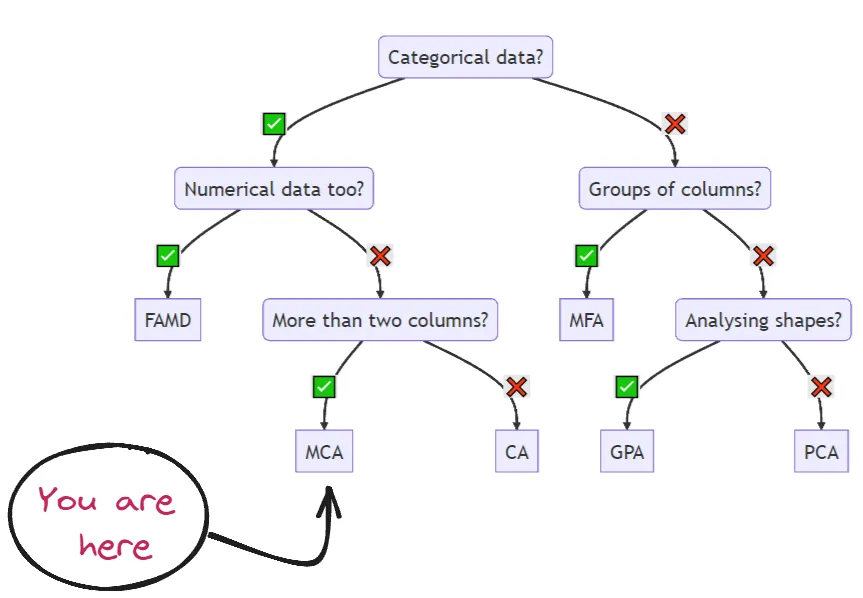

In [1]:
import sys  
sys.path.insert(1, '../src/')

from visualize import get_pca_nd, get_mca_nd, plot_pca_3d, plot_pca_2d

In [26]:
mca_3d, mca_3d_df = get_mca_nd(df_no_outliers_norm, clusters)
mca_3d_df

,comp1,comp2,comp3,cluster
0,-0.254391,1.068586,-0.299286,2
1,-0.266283,-0.270035,0.122622,0
2,0.062269,-0.295689,-0.143010,0
3,0.342681,-0.166842,-0.396803,0
5,-0.400769,0.389465,-0.489270,0
...,...,...,...,...
45202,-0.333725,-0.224912,0.284518,1
45204,2.259727,2.312923,3.438660,2
45206,-0.152410,0.349753,-0.294224,2
45209,0.720811,0.169274,0.248605,2


In [27]:
mca_3d.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.275,0.04%,0.04%
1,0.263,0.03%,0.07%
2,0.233,0.03%,0.10%


💭 Looked at the variability of the 3 components provided by the MCA, we obtain basically zero variability !! In other words, we **cannot** draw clear conclusions from our model with the information provided by the dimensionality reduction provided by MCA.

💭 We also try with MCA 2 components !!

In [30]:
mca_2d, mca_2d_df = get_mca_nd(df_no_outliers_norm, clusters, ndim=2)
mca_2d_df

,comp1,comp2,cluster
0,-0.254391,1.068586,2
1,-0.266283,-0.270035,0
2,0.062269,-0.295689,0
3,0.342681,-0.166842,0
5,-0.400769,0.389465,0
...,...,...,...
45202,-0.333725,-0.224912,1
45204,2.259727,2.312923,2
45206,-0.152410,0.349753,2
45209,0.720811,0.169274,2


In [31]:
mca_2d.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.275,0.04%,0.04%
1,0.263,0.03%,0.07%


💭 Now we make a plot using the reduction provided by the MCA method 

In [33]:
plot_pca_3d(mca_3d_df, title="MCA Space", opacity=1, width_line = 0.1)

In [34]:
plot_pca_2d(mca_3d_df, title="MCA Space", opacity=1, width_line = 0.5)

💭 We cannot clearly draw clear conclusions from our model :<

By showing these results, we have what happenes in real data projects. Good results are not always obtained !! But good data scientist knows how to recognize the causes.

We have one option to visually determine if the model creatd by the K-Prototype method is suitable or not. This path is simple:
- This is applying PCA to the dataset to which preprocessing has been performed to transform the categorical variables into numerical ones.
- Obtain the components of the PCA
- Make a representation using the PCA components such as the axes and the color of the points to predict the K-Prototype model.

In [36]:
# With PCA, we must use instead data_no_outliers of df_no_outliers_norm
pca_3d_object, df_pca_3d = get_pca_nd(data_no_outliers, clusters)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              1.493        18.66%                     18.66%
1              1.322        16.53%                     35.19%
2              1.055        13.18%                     48.37%


In [37]:
# With PCA, we must use instead data_no_outliers of df_no_outliers_norm
pca_2d_object, df_pca_2d = get_pca_nd(data_no_outliers, clusters, ndim=2)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.5)
print("The variability is :", pca_2d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              1.493        18.66%                     18.66%
1              1.322        16.53%                     35.19%


💭 It doesn’t look bad, in fact it has a certain resemblance to what has been obtained in Kmeans.

Finally, let's explore a little how the model works, in which features are the most important and what are the main characteristics of the clusters

In [38]:
df_no_outliers_norm.dtypes

job           object
marital       object
education     object
default       object
housing       object
loan          object
age          float64
balance      float64
dtype: object

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 346
[LightGBM] [Info] Number of data points in the train set: 40691, number of used features: 8
[LightGBM] [Info] Start training from score -1.064025
[LightGBM] [Info] Start training from score -1.336231
[LightGBM] [Info] Start training from score -1.273183
[LightGBM] [Info] Start training from score -3.634617
[LightGBM] [Info] Start training from score -2.456105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

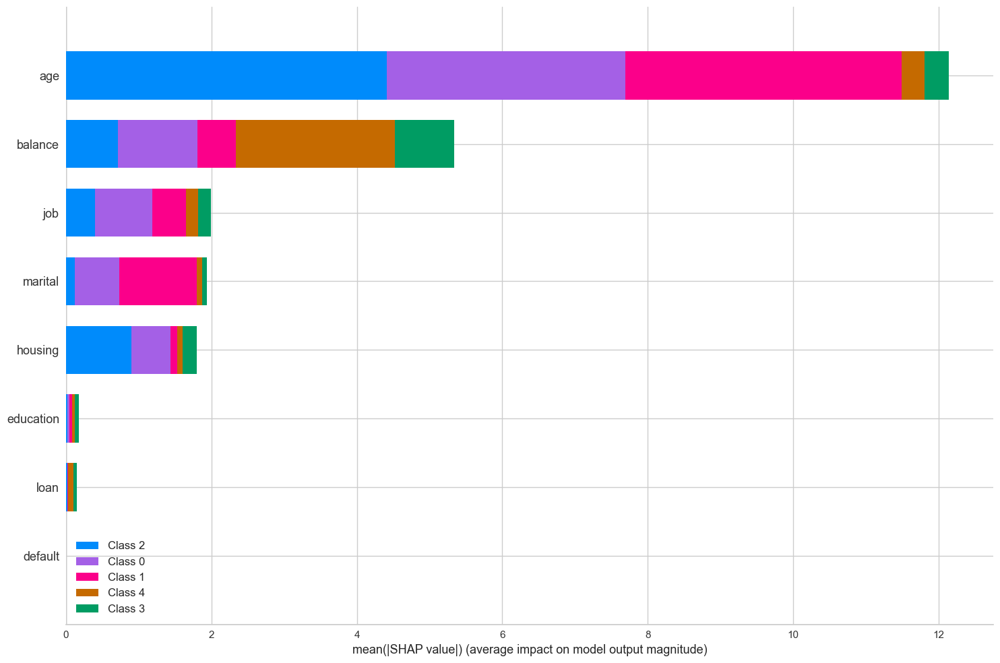

In [39]:
clf_lgb = lgb.LGBMClassifier(colsample_bytree=0.8)

for col in ["job", "marital", "education", "housing", "loan", "default"]:
    df_no_outliers_norm[col] = df_no_outliers_norm[col].astype('category')

clf_lgb.fit(
    X=df_no_outliers_norm,
    y=clusters,
    feature_name='auto',
    categorical_feature='auto'
)

explainer_km = shap.TreeExplainer(clf_lgb)
shap_values_km = explainer_km.shap_values(df_no_outliers_norm)
shap.summary_plot(shap_values_km, df_no_outliers_norm, plot_type="bar", plot_size=(15, 10))

💭 Characteristics of the clusters

In [40]:
df_no_outliers = df[df.outliers == 0]
df_no_outliers["cluster"] = clusters

df_no_outliers.groupby('cluster').agg(
    {
        'age':'mean',
        'balance': 'mean',
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        'default': lambda x: x.value_counts().index[0],
        
    }
).sort_values("balance").reset_index()

C:\Users\xuanh\AppData\Local\Temp\ipykernel_3452\2279410345.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cluster,age,balance,job,marital,education,housing,loan,default
0,3,39.372439,-378.718808,blue-collar,married,secondary,yes,no,no
1,0,38.745175,614.623531,blue-collar,married,secondary,yes,no,no
2,1,30.196821,701.495933,management,single,secondary,yes,no,no
3,2,52.438855,868.352647,management,married,secondary,no,no,no
4,4,41.458166,6352.602006,management,married,secondary,yes,no,no


# Conclusion

💭 The variables with the greatest weight are the numerical ones, notably seeing that the confinement of these two features is almost sufficient to differentiate each cluster. 